In [1]:
import json
import pandas as pd
from pathlib import Path

with open("../Sample_Data/labeled_trackings_from_api.json") as f:
    data = json.load(f)

print(f"Loaded {len(data)} trackings.")


Loaded 8 trackings.


In [2]:
rows = []
for t in data:
    for point in t["points"]:
        row = {
            "tracking_id": t["id"],
            "name": t["name"],
            "label": t.get("label"),
            "duration": t["duration"],
            "length": t["length"],
            "latitude": point["latitude"],
            "longitude": point["longitude"],
            "sequence": point["sequence"],
            "speed": point["speed"],
            "time": point["time"],
        }
        rows.append(row)

df = pd.DataFrame(rows)
df["time"] = pd.to_datetime(df["time"])
df.head()


,tracking_id,name,label,duration,length,latitude,longitude,sequence,speed,time
0,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.282006,14.304086,0,0.0,2025-02-28 06:13:44+01:00
1,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.280932,14.301821,1,0.0,2025-02-28 06:13:56+01:00
2,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.280776,14.301146,2,0.0,2025-02-28 06:14:01+01:00
3,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.280854,14.301254,3,0.0,2025-02-28 06:14:08+01:00
4,99476,0975abe81a084daeaf8b1b03f9afd981,URBAN,154460000000,21.069127,48.281212,14.302188,4,0.0,2025-02-28 06:14:18+01:00


In [3]:
import folium

m = folium.Map(location=[48.2, 14.3], zoom_start=12)

for _, row in df.iterrows():
    folium.CircleMarker(
        location=(row["latitude"], row["longitude"]),
        radius=2,
        color="blue" if row["label"] == "RURAL" else "green",
        fill=True,
        fill_opacity=0.6
    ).add_to(m)

m


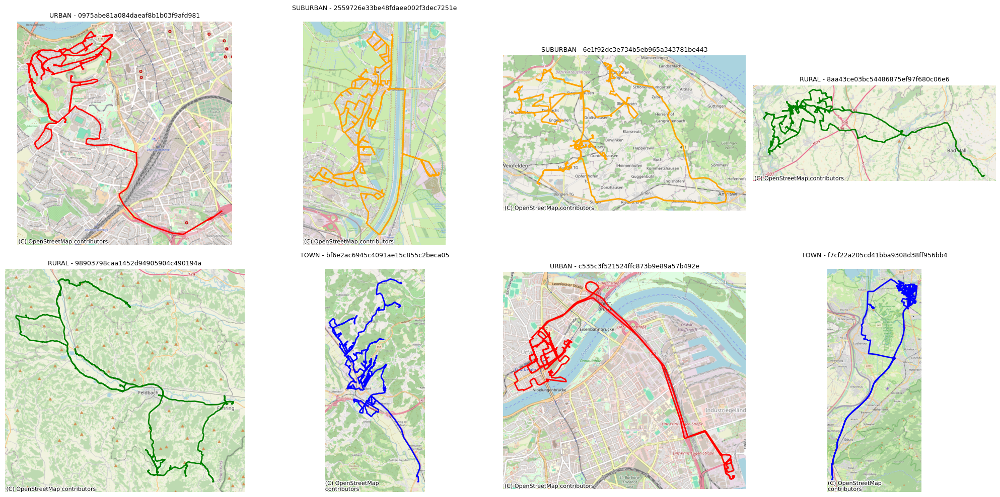

In [4]:
import json
from pathlib import Path
import matplotlib.pyplot as plt
import contextily as ctx
import geopandas as gpd
from shapely.geometry import LineString

data_path = Path("../Sample_Data/labeled_trackings_from_api.json")
with open(data_path, "r", encoding="utf-8") as f:
    trackings = json.load(f)

fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

color_map = {
    "RURAL": "green",
    "SUBURBAN": "orange",
    "TOWN": "blue",
    "URBAN": "red"
}

for i, tracking in enumerate(trackings):
    ax = axes[i]
    points = tracking.get("points", [])
    if not points:
        continue

    coords = [(p["longitude"], p["latitude"]) for p in points]
    line = LineString(coords)

    gdf = gpd.GeoDataFrame(index=[0], geometry=[line], crs="EPSG:4326")
    gdf = gdf.to_crs(epsg=3857)  

    gdf.plot(ax=ax, color=color_map.get(tracking["label"], "gray"), linewidth=2)
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

    ax.set_title(f'{tracking["label"]} - {tracking["name"]}', fontsize=9)
    ax.set_axis_off()

for j in range(len(trackings), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig("../../../../Thesis/Text/Figures/sample_tracking_routes_mapgrid.png", dpi=300)
plt.show()


In [5]:
from geopy.distance import geodesic
from math import radians, sin, cos, atan2, sqrt
import numpy as np
import pandas as pd

def calculate_bearing(p1, p2):
    """Returns the bearing in radians between two (lat, lon) points."""
    lat1, lon1 = radians(p1[0]), radians(p1[1])
    lat2, lon2 = radians(p2[0]), radians(p2[1])
    dlon = lon2 - lon1

    x = sin(dlon) * cos(lat2)
    y = cos(lat1)*sin(lat2) - sin(lat1)*cos(lat2)*cos(dlon)
    bearing = atan2(x, y)
    return bearing

def extract_features(tracking):
    points = tracking["points"]
    if len(points) < 2:
        return None

    coords = [(p["latitude"], p["longitude"]) for p in points]

    dists = [geodesic(coords[i], coords[i+1]).meters for i in range(len(coords) - 1)]
    total_dist = sum(dists)

    lats = [p["latitude"] for p in points]
    lons = [p["longitude"] for p in points]

    lat_min, lat_max = min(lats), max(lats)
    lon_min, lon_max = min(lons), max(lons)

    height = geodesic((lat_min, lon_min), (lat_max, lon_min)).meters
    width = geodesic((lat_min, lon_min), (lat_min, lon_max)).meters
    bbox_area = height * width
    point_density = len(points) / (bbox_area + 1e-6)

    # Straightness
    straight_line = geodesic(coords[0], coords[-1]).meters
    straightness = straight_line / total_dist if total_dist > 0 else 0

    # Mean heading change
    angle_changes = []
    for i in range(1, len(coords) - 1):
        prev_bearing = calculate_bearing(coords[i - 1], coords[i])
        next_bearing = calculate_bearing(coords[i], coords[i + 1])
        delta = abs(next_bearing - prev_bearing)
        if delta > np.pi:
            delta = 2 * np.pi - delta
        angle_changes.append(delta)
    mean_heading_change = np.mean(angle_changes) if angle_changes else 0

    return {
        "tracking_id": tracking["id"],
        "label": tracking.get("label"),
        "length": tracking["length"],
        "duration": tracking["duration"] / 1e9,
        "num_points": len(points),
        "bbox_area": bbox_area,
        "point_density": point_density,
        "avg_segment_distance": total_dist / len(dists),
        "straightness": straightness,
        "mean_heading_change": mean_heading_change,
    }

# Apply to your sample data
features = [extract_features(t) for t in data]
features = [f for f in features if f]
features_df = pd.DataFrame(features)
features_df.head()



features_df.to_csv("tracking_feautres_sample.csv", index=False)



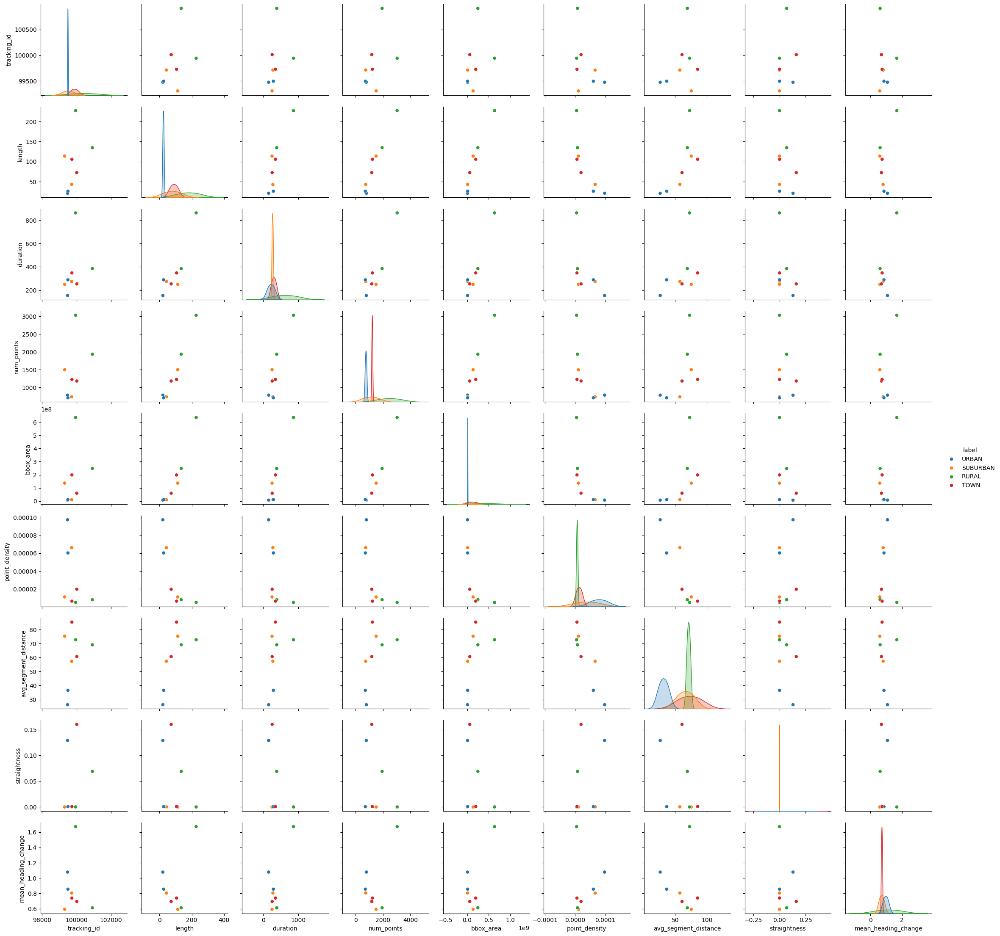

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(features_df, hue="label")

plt.savefig("../../../../Thesis/Text/Figures/sample_pairplot.png", dpi=300, bbox_inches="tight")


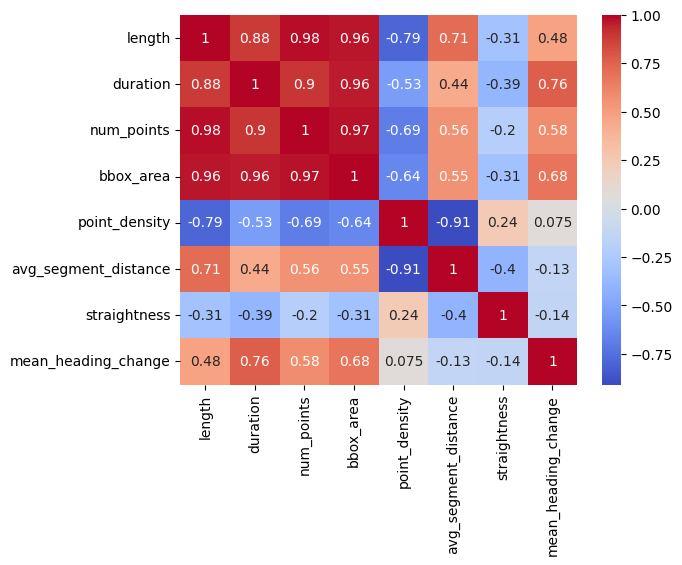

In [7]:
sns.heatmap(features_df.drop(columns=["label", "tracking_id"]).corr(), annot=True, cmap="coolwarm")
plt.savefig("../../../../Thesis/Text/Figures/sample_correlation_matrix.png", dpi=300, bbox_inches="tight")


/tmp/ipykernel_27084/1902302043.py:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y="point_density", palette=label_palette, order=label_order)


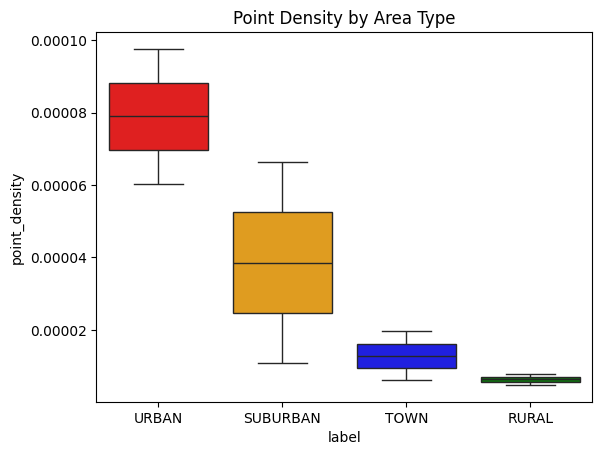

In [8]:
label_palette = {
    "URBAN": "red",
    "SUBURBAN": "orange",
    "TOWN": "blue",
    "RURAL": "green"
}
label_order = ["URBAN", "SUBURBAN", "TOWN", "RURAL"]

sns.boxplot(data=features_df, x="label", y="point_density", palette=label_palette, order=label_order)
plt.title("Point Density by Area Type")
plt.savefig("../../../../Thesis/Text/Figures/sample_point_density_boxplot.png", dpi=300, bbox_inches="tight")

In [9]:
# features_to_use = [
#     "num_points", "bbox_area", "point_density", "avg_segment_distance",
#     "straightness", "mean_heading_change", "duration", "length"
# ]
# label_order = ["URBAN", "SUBURBAN", "TOWN", "RURAL"]
# label_palette = {
#     "URBAN": "red",
#     "SUBURBAN": "orange",
#     "TOWN": "blue",
#     "RURAL": "green"
# }
# medians = features_df.groupby("label")[features_to_use].median()

# # Step 2: Reorder rows by label (to match initial_centroids ordering)
# medians_ordered = medians.loc[label_order].values

# print(medians_ordered)


In [10]:
# # initial centroid for kmeans -> needs to be scaled 

# initial_centroid_basis = [[7.44000000e+02, 9.85624763e+06, 7.89707429e-05, 3.15147635e+01, 6.48781611e-02, 9.66726038e-01, 2.21920000e+02, 2.36154892e+01],[1.11500000e+03, 7.40008273e+07, 3.85954017e-05, 6.62893505e+01, 1.48064194e-04, 6.98741232e-01, 2.62845000e+02, 7.83804532e+01],[1.20150000e+03, 1.29571821e+08, 1.28529575e-05, 7.30079325e+01, 8.05481654e-02, 7.16996345e-01, 3.01060000e+02, 8.91263029e+01],[2.48350000e+03, 4.41215165e+08, 6.29195100e-06, 7.09120864e+01, 3.45994782e-02, 1.14142088e+00, 6.24595000e+02, 1.80924951e+02]]


In [11]:
# import numpy as np
# import pandas as pd

# # Step 1: Median per class per feature
# medians = features_df.groupby("label")[features_to_use].median()

# # Step 2: Range of medians across classes
# median_ranges = medians.max() - medians.min()

# # Step 3: Normalize to mean = 1
# feature_weights = median_ranges / median_ranges.mean()

# # Convert to array
# feature_weights_array = feature_weights.values
# print("Feature weights:", feature_weights_array)

In [12]:
# medians = features_df.groupby("label")[features_to_use].median()
# medians_normalized = (medians - medians.mean()) / medians.std()
# median_ranges = medians_normalized.max() - medians_normalized.min()
# feature_weights = median_ranges / median_ranges.mean()

# print("Feature weights:", feature_weights)


/tmp/ipykernel_27084/2093416004.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)


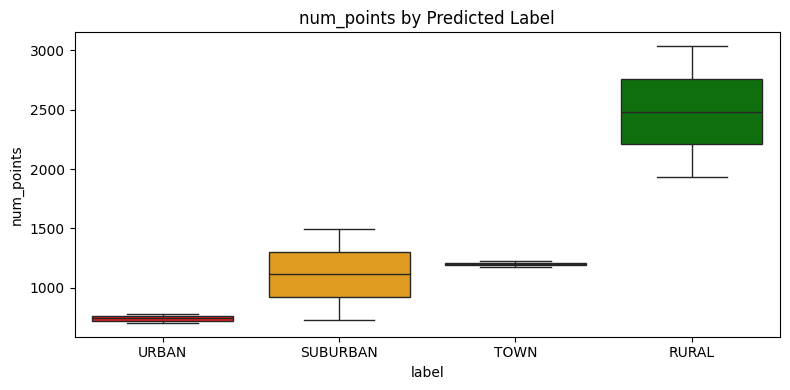

/tmp/ipykernel_27084/2093416004.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)


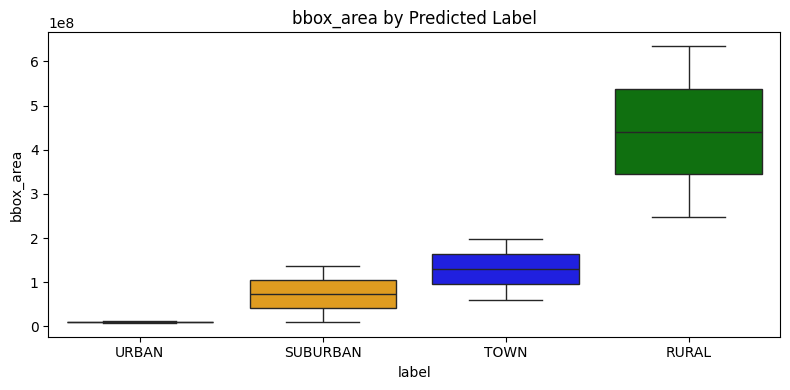

/tmp/ipykernel_27084/2093416004.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)


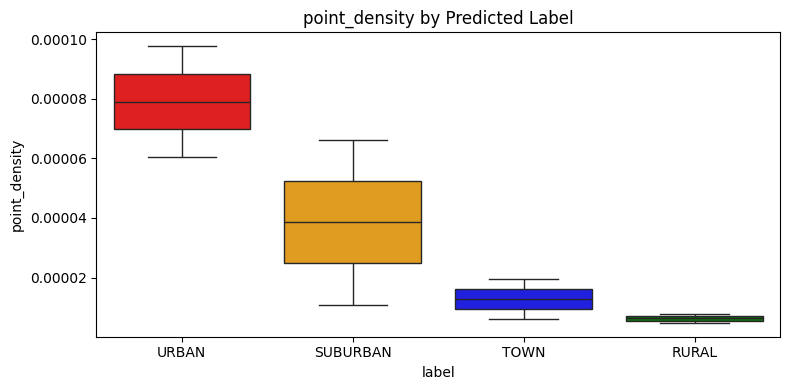

/tmp/ipykernel_27084/2093416004.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)


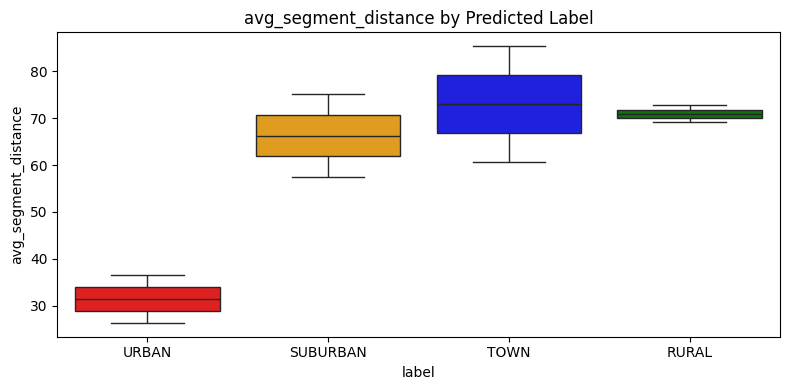

/tmp/ipykernel_27084/2093416004.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)


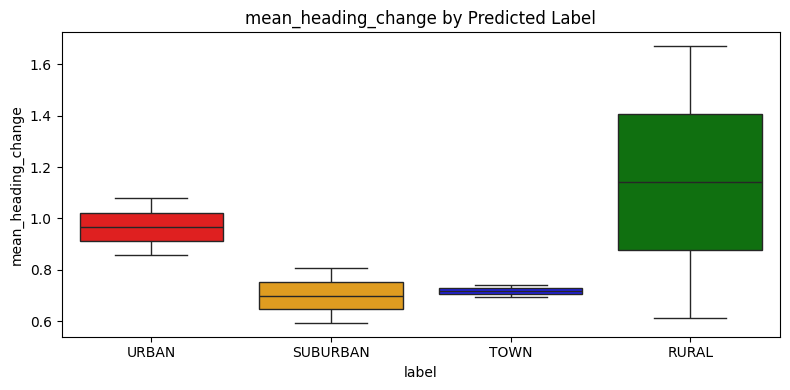

/tmp/ipykernel_27084/2093416004.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)


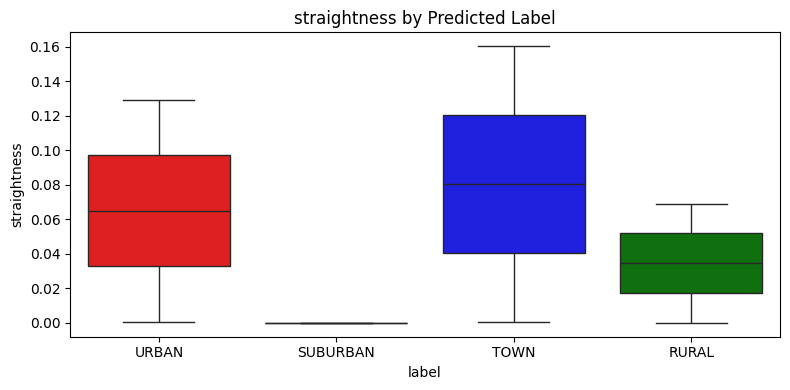

/tmp/ipykernel_27084/2093416004.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)


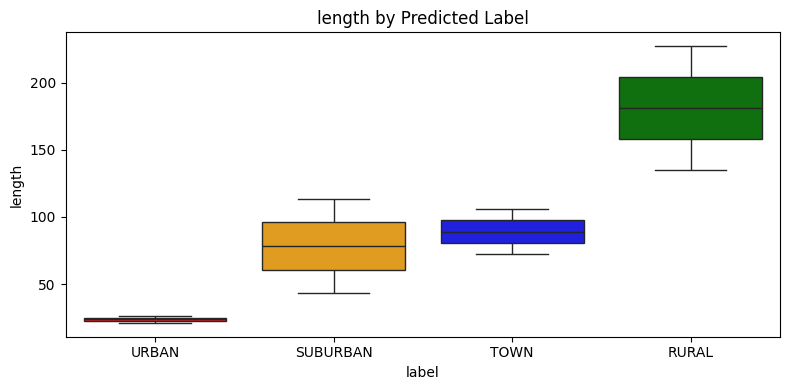

/tmp/ipykernel_27084/2093416004.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)


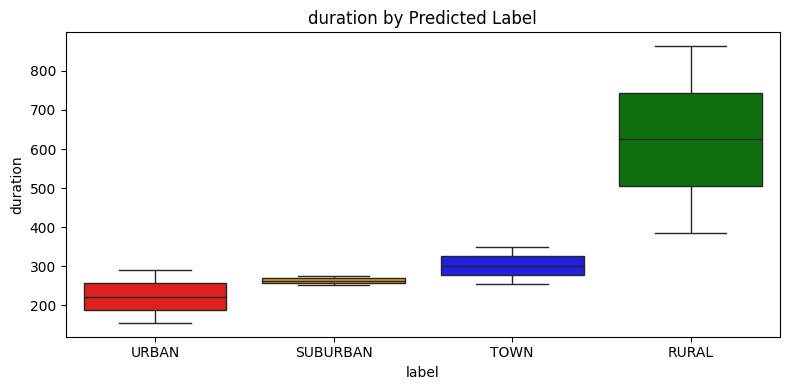

In [13]:
features_to_use = ["num_points", "bbox_area", "point_density", "avg_segment_distance", "mean_heading_change", "straightness", "length", "duration"]
label_palette = {
    "URBAN": "red",
    "SUBURBAN": "orange",
    "TOWN": "blue",
    "RURAL": "green"
}
label_order = ["URBAN", "SUBURBAN", "TOWN", "RURAL"]


for feature in features_to_use:
    plt.figure(figsize=(8, 4))
    sns.boxplot(data=features_df, x="label", y=feature, showfliers=False, palette=label_palette, order=label_order)
    plt.title(f"{feature} by Predicted Label")
    plt.tight_layout()
    plt.show()